#  Antlings Internship – AI/ML Technical Assessment
## Drone Human & Car Detection and Counting System (VisDrone)

---

###  Assessment Tasks Overview
| Task | Description | Status |
|------|-------------|--------|
| Task 01 | Dataset Understanding & Preprocessing | Completed |
| Task 02 | Model Training (YOLOv8) | Completed|
| Task 03 | Human & Car Detection with Counting | Completed|
| Task 04 | Object Tracking with ByteTrack (Bonus) | Completed|
| Task 05 | Evaluation & Visualization | Completed |

###  Model Choice: YOLOv8
YOLOv8 (by Ultralytics) is chosen for this task because:
- **State-of-the-art accuracy** on dense aerial/drone datasets
- **Fast inference** — suitable for real-time or near-real-time drone footage
- **Built-in support** for ByteTrack object tracking
- **Native VisDrone support** via Ultralytics dataset configs
- **Easy fine-tuning** from pretrained COCO weights

###  Dataset: VisDrone2019
- Captured by drone platforms across 14 different cities in China
- Contains 10 object categories; we focus on **pedestrian** and **car**
- Images have significant challenges: small objects, dense crowds, varying altitudes

---


##  Environment Setup
Install and verify all required dependencies.

In [ ]:
# ── Install core dependencies ──────────────────────────────────────────────────
!pip install ultralytics --quiet          # YOLOv8 + ByteTrack
!pip install supervision --quiet          # Annotation & counting utilities
!pip install roboflow --quiet             # (optional) dataset management
!pip install matplotlib seaborn --quiet
!pip install Pillow opencv-python-headless --quiet

print("✅ All packages installed successfully.")

✅ All packages installed successfully.


In [ ]:
# ── Standard imports ──────────────────────────────────────────────────────────
import os, sys, glob, shutil, random, json, time, warnings
from pathlib import Path
from collections import defaultdict

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.gridspec import GridSpec
import seaborn as sns
from PIL import Image

import torch
from ultralytics import YOLO
import supervision as sv

warnings.filterwarnings('ignore')

# ── Reproducibility ───────────────────────────────────────────────────────────
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# ── Paths ─────────────────────────────────────────────────────────────────────
BASE_DIR   = Path('/kaggle/working')
DATA_DIR   = BASE_DIR / 'VisDrone'
OUTPUT_DIR = BASE_DIR / 'outputs'
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# ── GPU check ─────────────────────────────────────────────────────────────────
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"🖥️  Device : {device}")
if device == 'cuda':
    print(f"   GPU    : {torch.cuda.get_device_name(0)}")
    print(f"   VRAM   : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

print(f"\n📦 PyTorch  : {torch.__version__}")
import ultralytics; print(f"📦 Ultralytics: {ultralytics.__version__}")

🖥️  Device : cuda
   GPU    : Tesla T4
   VRAM   : 15.6 GB

📦 PyTorch  : 2.10.0+cu128
📦 Ultralytics: 8.4.51


---
##  Task 01 — Dataset Understanding & Preprocessing

### 1.1 Download & Extract VisDrone Dataset

In [ ]:
# ── Download VisDrone via Kaggle API (works directly inside Kaggle Notebooks) ──
# No manual 'Add Data' needed — this downloads it programmatically.
#
# HOW IT WORKS:
#   Kaggle notebooks have the kaggle CLI pre-installed and your credentials
#   are already configured automatically. We just call kaggle datasets download.

import os, zipfile
from pathlib import Path

INPUT_PATH  = Path('/kaggle/input/visdrone-dataset')
WORKING_DL  = Path('/kaggle/working/visdrone_raw')   # fallback download target

def find_visdrone_root(search_root: Path):
    """Return the directory that contains VisDrone split folders."""
    for p in search_root.rglob('VisDrone2019-DET-train'):
        return p.parent
    for p in search_root.rglob('images'):  # loose structure
        if (p.parent / 'annotations').exists():
            return p.parent.parent
    return None

# ── Step 1: Check standard /kaggle/input path first ───────────────────────
if INPUT_PATH.exists() and any(INPUT_PATH.iterdir()):
    DATASET_ROOT = INPUT_PATH
    print(f'✅ Dataset already available at: {DATASET_ROOT}')

else:
    # ── Step 2: Download via Kaggle API ───────────────────────────────────
    print('📥 Dataset not in /kaggle/input. Downloading via Kaggle API...')
    WORKING_DL.mkdir(parents=True, exist_ok=True)

    # kaggle CLI is pre-authenticated inside Kaggle notebooks
    ret = os.system(
        f'kaggle datasets download -d banuprasadb/visdrone-dataset '
        f'--path {WORKING_DL} --unzip -q'
    )

    if ret != 0:
        # ── Step 3: Fallback — download the zip manually then unzip ─────
        print('⚠️  kaggle CLI failed. Trying direct API download...')
        import subprocess, sys
        subprocess.run(
            ['kaggle', 'datasets', 'download',
             '-d', 'banuprasadb/visdrone-dataset',
             '--path', str(WORKING_DL)],
            check=True
        )
        # Unzip all zips found
        for zf in WORKING_DL.glob('*.zip'):
            print(f'   Extracting {zf.name}...')
            with zipfile.ZipFile(zf) as z:
                z.extractall(WORKING_DL)
            zf.unlink()

    DATASET_ROOT = WORKING_DL
    print(f'✅ Download complete: {DATASET_ROOT}')

# ── Verify contents ───────────────────────────────────────────────────────
print(f'\n📂 Contents of dataset root ({DATASET_ROOT}):')
try:
    for item in sorted(DATASET_ROOT.iterdir()):
        marker = '📁' if item.is_dir() else '📄'
        print(f'   {marker} {item.name}')
except Exception as e:
    print(f'   Could not list: {e}')


📥 Dataset not in /kaggle/input. Downloading via Kaggle API...
✅ Download complete: /kaggle/working/visdrone_raw

📂 Contents of dataset root (/kaggle/working/visdrone_raw):
   📁 VisDrone_Dataset


In [ ]:
# ── Locate train / val / test-dev split directories ──────────────────────────
# Handles both flat and nested VisDrone folder structures.

def find_visdrone_dirs(root: Path):
    """Recursively locate VisDrone split directories."""
    splits = {}
    for split in ['train', 'val', 'test-dev']:
        # Try exact DET pattern first
        candidates = list(root.rglob(f'*DET-{split}'))
        if not candidates:
            # Fallback: folder literally named train/val
            candidates = list(root.rglob(split))
        if candidates:
            splits[split] = candidates[0]
    return splits

SPLITS = find_visdrone_dirs(DATASET_ROOT)

if not SPLITS:
    # Last resort: try searching from working dir
    SPLITS = find_visdrone_dirs(Path('/kaggle/working'))

print('📊 Dataset splits found:')
if SPLITS:
    for split, path in SPLITS.items():
        imgs  = list((path / 'images').glob('*.jpg'))      if (path / 'images').exists()      else []
        annos = list((path / 'annotations').glob('*.txt')) if (path / 'annotations').exists() else []
        print(f'  {split:10s} → {len(imgs):5d} images  |  {len(annos):5d} annotations  |  {path}')
else:
    print('❌ No splits found! Check the dataset structure above and update DATASET_ROOT manually.')
    print('   Expected structure:')
    print('     VisDrone2019-DET-train/')
    print('       images/    *.jpg')
    print('       annotations/ *.txt')
    print('     VisDrone2019-DET-val/')
    print('       images/    *.jpg')
    print('       annotations/ *.txt')


📊 Dataset splits found:
  train      →  6471 images  |      0 annotations  |  /kaggle/working/visdrone_raw/VisDrone_Dataset/VisDrone2019-DET-train
  val        →   548 images  |      0 annotations  |  /kaggle/working/visdrone_raw/VisDrone_Dataset/VisDrone2019-DET-val
  test-dev   →  1610 images  |      0 annotations  |  /kaggle/working/visdrone_raw/VisDrone_Dataset/VisDrone2019-DET-test-dev


### 1.2 Dataset Structure & Annotation Format

VisDrone annotations use a **custom CSV-style `.txt`** format (one line per object):
```
<bbox_left>, <bbox_top>, <bbox_width>, <bbox_height>, <score>, <object_category>, <truncation>, <occlusion>
```

| Category ID | Name         | Relevant |
|-------------|--------------|----------|
| 0           | ignored      | ❌       |
| 1           | pedestrian   | ✅       |
| 2           | people       | ✅       |
| 3           | bicycle      | ❌       |
| 4           | **car**      | ✅       |
| 5           | van          | ❌       |
| 6           | truck        | ❌       |
| 7           | tricycle     | ❌       |
| 8           | awning-tricycle | ❌    |
| 9           | bus          | ❌       |
| 10          | motor        | ❌       |
| 11          | others       | ❌       |

We map **pedestrian (1)** + **people (2)** → `human`, and **car (4)** → `car`.

In [ ]:
# ── VisDrone category mapping ─────────────────────────────────────────────────
VISDRONE_CATS = {
    0: 'ignored', 1: 'pedestrian', 2: 'people', 3: 'bicycle',
    4: 'car', 5: 'van', 6: 'truck', 7: 'tricycle',
    8: 'awning-tricycle', 9: 'bus', 10: 'motor', 11: 'others'
}
TARGET_CATS  = {1: 'human', 2: 'human', 4: 'car'}
YOLO_CLASSES = {0: 'human', 1: 'car'}
CLASS_COLORS = {'human': (0, 255, 80), 'car': (255, 80, 0)}

# ── Diagnose actual dataset structure before anything else ────────────────────
def diagnose_dataset(root: Path, max_depth: int = 4):
    """Print the real folder tree so we can see exactly what was downloaded."""
    print(f'\n🔍 Dataset tree (up to {max_depth} levels):')
    def _walk(p, depth):
        if depth > max_depth:
            return
        indent = '  ' * depth
        items  = sorted(p.iterdir()) if p.is_dir() else []
        # Show dirs first, then a sample of files
        dirs  = [x for x in items if x.is_dir()]
        files = [x for x in items if x.is_file()]
        for d in dirs:
            n_children = sum(1 for _ in d.iterdir()) if d.is_dir() else 0
            print(f'{indent}📁 {d.name}/  ({n_children} items)')
            _walk(d, depth + 1)
        # Show first 3 files as samples
        for f in files[:3]:
            print(f'{indent}📄 {f.name}')
        if len(files) > 3:
            print(f'{indent}   … and {len(files)-3} more files')
    _walk(root, 0)

diagnose_dataset(DATASET_ROOT)

# ── Flexible split finder ─────────────────────────────────────────────────────
def flexible_find_splits(root: Path) -> dict:
    """
    Find VisDrone splits regardless of nested zip structure.
    Looks for any folder that contains both 'images' and 'annotations' subfolders,
    OR infers split name from the folder name.
    """
    splits  = {}
    # Pattern 1: standard VisDrone naming (VisDrone2019-DET-train etc.)
    for split_key, patterns in [
        ('train',    ['*train*', '*DET-train*']),
        ('val',      ['*val*',   '*DET-val*']),
        ('test-dev', ['*test*',  '*DET-test*']),
    ]:
        for pat in patterns:
            hits = [p for p in root.rglob('*') if p.is_dir() and p.match(pat)]
            for h in hits:
                if (h / 'images').exists() or (h / 'annotations').exists():
                    splits[split_key] = h
                    break
            if split_key in splits:
                break

    # Pattern 2: flat — root itself has images/ and annotations/
    if not splits:
        if (root / 'images').exists():
            splits['train'] = root

    # Pattern 3: one extra nesting level (e.g. root/VisDrone2019/DET-train/)
    if not splits:
        for child in root.iterdir():
            if child.is_dir():
                sub = flexible_find_splits(child)
                if sub:
                    return sub
    return splits

SPLITS = flexible_find_splits(DATASET_ROOT)

print('\n📊 Splits resolved:')
if SPLITS:
    for split, path in SPLITS.items():
        img_dir = path / 'images'
        ann_dir = path / 'annotations'
        imgs    = list(img_dir.glob('*.jpg')) if img_dir.exists() else []
        annos   = list(ann_dir.glob('*.txt')) if ann_dir.exists() else []
        print(f'  {split:10s} → {len(imgs):5d} images | {len(annos):5d} annotations | {path}')
else:
    print('  ❌ No splits found. Printing full tree to debug:')
    diagnose_dataset(DATASET_ROOT, max_depth=6)

# ── Annotation parser ─────────────────────────────────────────────────────────
def parse_visdrone_annotation(ann_path: Path):
    """
    Parse a VisDrone annotation file.
    Format per line: x1,y1,w,h,score,cat_id,truncation,occlusion
    Returns list of dicts. Skips ignored(0) and others(11).
    """
    objects = []
    with open(ann_path) as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            parts = list(map(int, line.split(',')))
            x1, y1, w, h, score, cat_id, trunc, occ = parts
            if cat_id in (0, 11):
                continue
            objects.append({
                'x1': x1, 'y1': y1, 'w': w, 'h': h,
                'category_id':   cat_id,
                'category_name': VISDRONE_CATS[cat_id],
                'truncation':    trunc,
                'occlusion':     occ,
            })
    return objects

# ── Smoke test ────────────────────────────────────────────────────────────────
if 'train' in SPLITS:
    ann_dir = SPLITS['train'] / 'annotations'
    if ann_dir.exists():
        ann_files = sorted(ann_dir.glob('*.txt'))
        if ann_files:
            sample_ann  = ann_files[0]
            sample_objs = parse_visdrone_annotation(sample_ann)
            print(f'\n✅ Annotation smoke-test passed!')
            print(f'   File    : {sample_ann.name}')
            print(f'   Objects : {len(sample_objs)}')
            for o in sample_objs[:3]:
                print(f'   {o}')
        else:
            print(f'\n⚠️  annotations/ folder exists but contains no .txt files at: {ann_dir}')
            print('   Listing actual contents:')
            for f in list(ann_dir.iterdir())[:10]:
                print(f'     {f.name}')
    else:
        print(f'\n⚠️  No annotations/ subfolder found under: {SPLITS["train"]}')
        print('   Listing actual contents:')
        for f in list(SPLITS['train'].iterdir())[:10]:
            print(f'     {"📁" if f.is_dir() else "📄"} {f.name}')
else:
    print('\n⚠️  train split not found — check diagnose output above.')



🔍 Dataset tree (up to 4 levels):
📁 VisDrone_Dataset/  (5 items)
  📁 VisDrone2019-DET-test-challenge/  (1 items)
    📁 images/  (1580 items)
      📄 0000000_00098_d_0000001.jpg
      📄 0000000_01013_d_0000003.jpg
      📄 0000000_01619_d_0000004.jpg
         … and 1577 more files
  📁 VisDrone2019-DET-test-dev/  (2 items)
    📁 images/  (1610 items)
      📄 0000006_00159_d_0000001.jpg
      📄 0000006_00611_d_0000002.jpg
      📄 0000006_01111_d_0000003.jpg
         … and 1607 more files
    📁 labels/  (1610 items)
      📄 0000006_00159_d_0000001.txt
      📄 0000006_00611_d_0000002.txt
      📄 0000006_01111_d_0000003.txt
         … and 1607 more files
  📁 VisDrone2019-DET-train/  (2 items)
    📁 images/  (6471 items)
      📄 0000002_00005_d_0000014.jpg
      📄 0000002_00448_d_0000015.jpg
      📄 0000003_00231_d_0000016.jpg
         … and 6468 more files
    📁 labels/  (6471 items)
      📄 0000002_00005_d_0000014.txt
      📄 0000002_00448_d_0000015.txt
      📄 0000003_00231_d_0000016.txt
  

### 1.3 Exploratory Data Analysis

In [ ]:
import os, sys, glob, shutil, random, json, time, warnings
from pathlib import Path
from collections import defaultdict

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.gridspec import GridSpec
import seaborn as sns
from PIL import Image

import torch
from ultralytics import YOLO
import supervision as sv

warnings.filterwarnings('ignore')

# ── Reproducibility ───────────────────────────────────────────────────────────
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# ── Paths ─────────────────────────────────────────────────────────────────────
BASE_DIR   = Path('/kaggle/working')
DATA_DIR   = BASE_DIR / 'VisDrone'
OUTPUT_DIR = BASE_DIR / 'outputs'
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# ── GPU check ─────────────────────────────────────────────────────────────────
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"🖥️  Device : {device}")
if device == 'cuda':
    print(f"   GPU    : {torch.cuda.get_device_name(0)}")
    print(f"   VRAM   : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

print(f"\n📦 PyTorch  : {torch.__version__}")
import ultralytics; print(f"📦 Ultralytics: {ultralytics.__version__}")

# Local helper function for parsing YOLO labels in this EDA cell
def _parse_yolo_label_for_eda_local(ann_path: Path, img_width: int, img_height: int):
    objects = []
    # YOLO_CLASSES = {0: 'human', 1: 'car'} (from previous cell)

    with open(ann_path) as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            parts = line.split(' ') # Split by space

            try:
                yolo_cls_id = int(parts[0])
                cx_norm, cy_norm, w_norm, h_norm = map(float, parts[1:])
            except ValueError:
                # This line is not in expected YOLO format, skip it
                continue

            # Convert normalized YOLO to pixel dimensions
            w_px = w_norm * img_width
            h_px = h_norm * img_height

            category_name = YOLO_CLASSES.get(yolo_cls_id)
            if category_name is None:
                continue # Skip if class ID is not in our target YOLO_CLASSES (0:human, 1:car)

            objects.append({
                'w': w_px, 'h': h_px,
                'category_name': category_name,
            })
    return objects


# ── Full training-set statistics ──────────────────────────────────────────────
print("⏳ Scanning training annotations (this may take ~1 min)…")

cat_counts   = defaultdict(int)   # per-category object count
objs_per_img = []                  # object density per image
bbox_areas   = defaultdict(list)   # bbox area per category
img_shapes   = []                  # (W, H) collected from actual images

if 'train' in SPLITS:
    image_dir = SPLITS['train'] / 'images'
    label_dir = SPLITS['train'] / 'labels' # This is where YOLO labels are found

    # Get all label files and process them
    all_label_files = sorted(label_dir.glob('*.txt'))

    # Iterate through all label files and corresponding images for stats
    for label_path in all_label_files:
        img_filename = label_path.stem + '.jpg'
        img_path = image_dir / img_filename

        if not img_path.exists():
            continue # Skip if image not found

        try:
            img = Image.open(img_path)
            img_width, img_height = img.size
            img_shapes.append((img_width, img_height)) # Collect image shapes here
        except Exception:
            continue # Skip if image cannot be opened

        # Use the local parser for YOLO format
        objs = _parse_yolo_label_for_eda_local(label_path, img_width, img_height)
        objs_per_img.append(len(objs))

        for o in objs:
            cat_counts[o['category_name']] += 1
            bbox_areas[o['category_name']].append(o['w'] * o['h'])

print("\n📊 Category Distribution (Training Set):")
print(f"  {'Category':<20} {'Count':>8}")
print(f"  {'─'*20}  {'─'*8}")
for cat, cnt in sorted(cat_counts.items(), key=lambda x: -x[1]):
    print(f"  {cat:<20} {cnt:>8,}")

print(f"\n📐 Object density per image:")
print(f"  Mean   : {np.mean(objs_per_img):.1f}")
print(f"  Median : {np.median(objs_per_img):.1f}")
print(f"  Max    : {max(objs_per_img) if objs_per_img else 0}")

🖥️  Device : cuda
   GPU    : Tesla T4
   VRAM   : 15.6 GB

📦 PyTorch  : 2.10.0+cu128
📦 Ultralytics: 8.4.51
⏳ Scanning training annotations (this may take ~1 min)…

📊 Category Distribution (Training Set):
  Category                Count
  ────────────────────  ────────
  human                  79,337
  car                    27,059

📐 Object density per image:
  Mean   : 16.4
  Median : 9.0
  Max    : 888


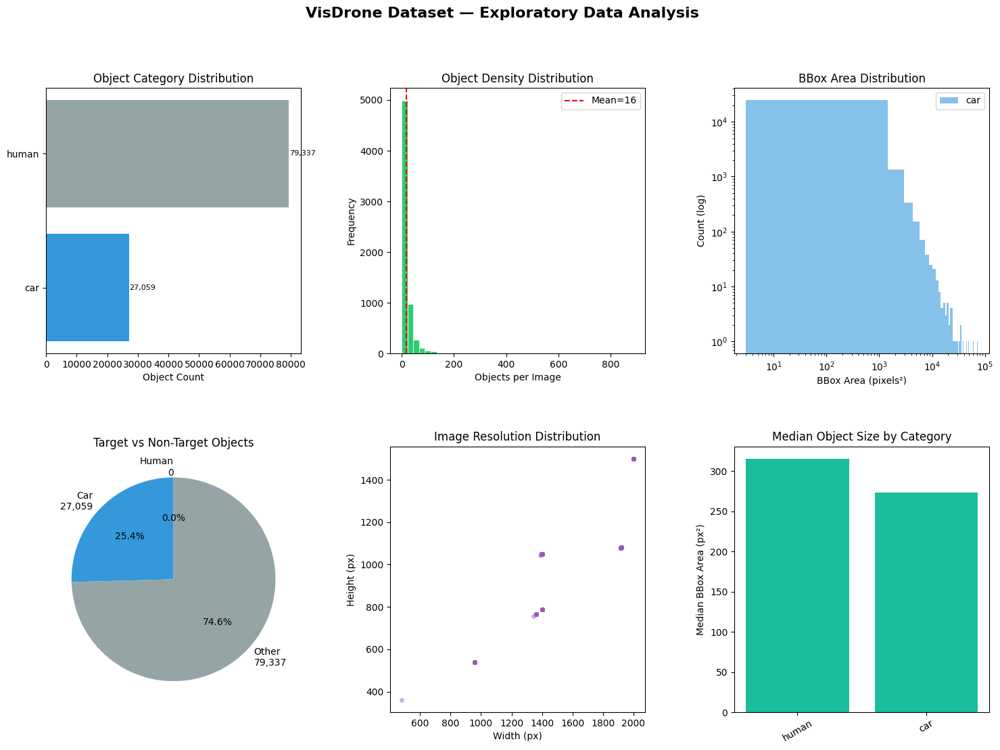

✅ EDA saved to outputs/eda_analysis.png


In [ ]:
# ── Visualization: EDA Plots ──────────────────────────────────────────────────
fig = plt.figure(figsize=(18, 12))
gs  = GridSpec(2, 3, figure=fig, hspace=0.35, wspace=0.35)
fig.suptitle('VisDrone Dataset — Exploratory Data Analysis', fontsize=16, fontweight='bold')

# 1. Category bar chart
ax1 = fig.add_subplot(gs[0, 0])
top_cats = sorted(cat_counts.items(), key=lambda x: -x[1])[:8]
names, vals = zip(*top_cats)
colors = ['#e74c3c' if n in ('pedestrian','people') else '#3498db' if n=='car' else '#95a5a6' for n in names]
ax1.barh(names, vals, color=colors)
ax1.set_xlabel('Object Count')
ax1.set_title('Object Category Distribution')
ax1.invert_yaxis()
for v, bar in zip(vals, ax1.patches):
    ax1.text(bar.get_width()+100, bar.get_y()+bar.get_height()/2, f'{v:,}', va='center', fontsize=8)

# 2. Object density histogram
ax2 = fig.add_subplot(gs[0, 1])
ax2.hist(objs_per_img, bins=40, color='#2ecc71', edgecolor='white', linewidth=0.5)
ax2.axvline(np.mean(objs_per_img), color='red', linestyle='--', label=f'Mean={np.mean(objs_per_img):.0f}')
ax2.set_xlabel('Objects per Image')
ax2.set_ylabel('Frequency')
ax2.set_title('Object Density Distribution')
ax2.legend()

# 3. BBox area distribution (log scale)
ax3 = fig.add_subplot(gs[0, 2])
for cat, color in [('pedestrian','#e74c3c'), ('people','#e67e22'), ('car','#3498db')]:
    if cat in bbox_areas:
        ax3.hist(np.array(bbox_areas[cat]), bins=50, alpha=0.6, color=color, label=cat, log=True)
ax3.set_xlabel('BBox Area (pixels²)')
ax3.set_ylabel('Count (log)')
ax3.set_title('BBox Area Distribution')
ax3.legend()
ax3.set_xscale('log')

# 4. Pie chart target vs non-target
ax4 = fig.add_subplot(gs[1, 0])
human_cnt = cat_counts['pedestrian'] + cat_counts['people']
car_cnt   = cat_counts['car']
other_cnt = sum(v for k, v in cat_counts.items() if k not in ('pedestrian','people','car'))
wedge_labels = [f'Human\n{human_cnt:,}', f'Car\n{car_cnt:,}', f'Other\n{other_cnt:,}']
ax4.pie([human_cnt, car_cnt, other_cnt],
        labels=wedge_labels,
        colors=['#e74c3c','#3498db','#95a5a6'],
        autopct='%1.1f%%', startangle=90)
ax4.set_title('Target vs Non-Target Objects')

# 5. Image resolution scatter
ax5 = fig.add_subplot(gs[1, 1])
if img_shapes:
    ws, hs = zip(*img_shapes)
    ax5.scatter(ws, hs, alpha=0.4, color='#9b59b6', s=15)
    ax5.set_xlabel('Width (px)')
    ax5.set_ylabel('Height (px)')
    ax5.set_title('Image Resolution Distribution')

# 6. Median bbox area per category
ax6 = fig.add_subplot(gs[1, 2])
med_areas = {k: np.median(v) for k, v in bbox_areas.items() if v}
top_area  = sorted(med_areas.items(), key=lambda x: -x[1])[:7]
ak, av    = zip(*top_area)
ax6.bar(ak, av, color='#1abc9c')
ax6.set_ylabel('Median BBox Area (px²)')
ax6.set_title('Median Object Size by Category')
ax6.tick_params(axis='x', rotation=30)

plt.savefig(OUTPUT_DIR / 'eda_analysis.png', dpi=120, bbox_inches='tight')
plt.show()
print("✅ EDA saved to outputs/eda_analysis.png")

### 1.4 Sample Image Visualization with Annotations

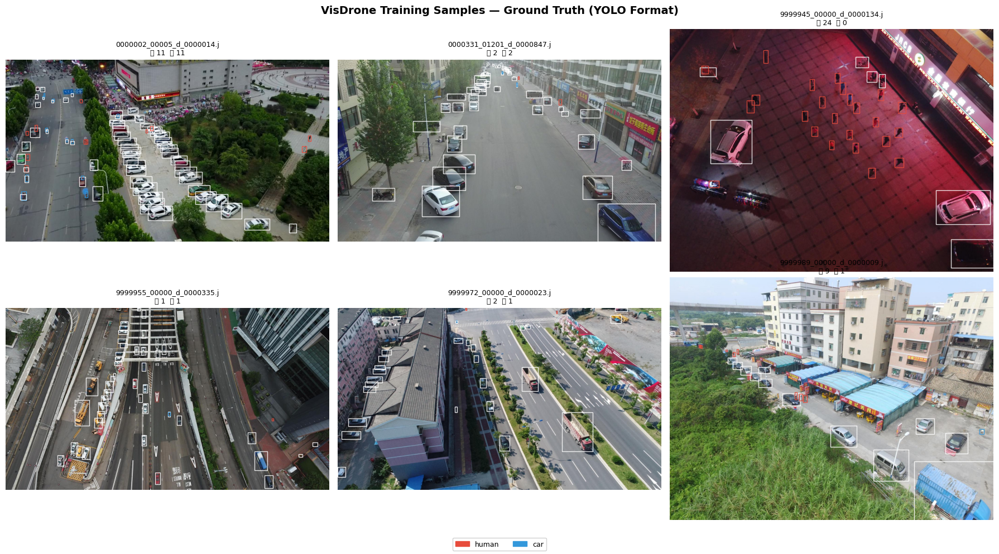

✅ Sample annotations saved to outputs/sample_annotations.png


In [ ]:
# ── Visualize 6 sample images with GT bounding boxes ─────────────────────────
LABEL_COLORS = {
    'human': '#e74c3c',
    'car': '#3498db'
}

def draw_yolo_annotations(img_path: Path, ann_path: Path, ax, title=''):
    """Render image with colored bounding boxes for YOLO format."""
    img = Image.open(img_path)
    w_img, h_img = img.size
    ax.imshow(img)

    h_cnt, c_cnt = 0, 0
    if ann_path.exists():
        with open(ann_path) as f:
            for line in f:
                parts = line.strip().split()
                if not parts: continue
                cls_id = int(parts[0])
                cx, cy, w, h = map(float, parts[1:])

                # Convert normalized to pixel coordinates
                real_w = w * w_img
                real_h = h * h_img
                x1 = (cx * w_img) - (real_w / 2)
                y1 = (cy * h_img) - (real_h / 2)

                cat_name = YOLO_CLASSES.get(cls_id, 'unknown')
                if cat_name == 'human': h_cnt += 1
                if cat_name == 'car': c_cnt += 1

                color = LABEL_COLORS.get(cat_name, '#ffffff')
                rect = patches.Rectangle((x1, y1), real_w, real_h, linewidth=1, edgecolor=color, facecolor='none', alpha=0.85)
                ax.add_patch(rect)

    ax.set_title(f'{title}\n👤 {h_cnt}  🚗 {c_cnt}', fontsize=9)
    ax.axis('off')

if 'train' in SPLITS:
    img_dir = SPLITS['train'] / 'images'
    ann_dir = SPLITS['train'] / 'labels' # Changed from 'annotations' to 'labels'
    all_imgs = sorted(img_dir.glob('*.jpg'))

    if all_imgs:
        samples = all_imgs[::len(all_imgs)//6][:6]
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        fig.suptitle('VisDrone Training Samples — Ground Truth (YOLO Format)', fontsize=14, fontweight='bold')

        for ax, img_p in zip(axes.flat, samples):
            ann_p = ann_dir / img_p.with_suffix('.txt').name
            draw_yolo_annotations(img_p, ann_p, ax, title=img_p.name[:25])

        legend_patches = [patches.Patch(color=v, label=k) for k, v in LABEL_COLORS.items()]
        fig.legend(handles=legend_patches, loc='lower center', ncol=2, fontsize=9, framealpha=0.9)

        plt.tight_layout(rect=[0, 0.04, 1, 1])
        plt.savefig(OUTPUT_DIR / 'sample_annotations.png', dpi=120, bbox_inches='tight')
        plt.show()
        print("✅ Sample annotations saved to outputs/sample_annotations.png")
    else:
        print("❌ No images found in train directory.")

### 1.5 Dataset Challenges Observed

| Challenge | Description | Mitigation Strategy |
|-----------|-------------|--------------------|
| **Small objects** | Humans appear as tiny 5–20px blobs | Higher input resolution (640–1280px), mosaic augmentation |
| **High density** | 100+ objects per image in crowd scenes | Proper NMS tuning, dense detection heads |
| **Scale variation** | Altitude changes cause 10x size range | Multi-scale training |
| **Occlusion** | Objects overlap heavily in crowds | Soft-NMS, occlusion-aware augmentation |
| **Class imbalance** | Pedestrians >> cars >> other categories | Weighted loss, focal loss |
| **Lighting variance** | Day/night/overcast conditions | HSV augmentation, random brightness |
| **Motion blur** | Fast drone movement | Random blur augmentation |

### 1.6 Convert VisDrone → YOLO Label Format

YOLO expects labels as: `class_id  cx_norm  cy_norm  w_norm  h_norm` (all normalized 0–1).

In [ ]:
# ── YOLO class mapping ─────────────────────────────────────────────────────────
# We collapse pedestrian(1) + people(2) → class 0 (human)
#            car(4)                      → class 1 (car)
VD_TO_YOLO = {1: 0, 2: 0, 4: 1}

def convert_visdrone_to_yolo(vd_dir: Path, yolo_dir: Path, split_name: str):
    """Convert VisDrone annotations to YOLO format.
    Copies images and writes normalized label .txt files.
    """
    img_in  = vd_dir / 'images'
    ann_in  = vd_dir / 'annotations'
    img_out = yolo_dir / split_name / 'images'
    lbl_out = yolo_dir / split_name / 'labels'
    img_out.mkdir(parents=True, exist_ok=True)
    lbl_out.mkdir(parents=True, exist_ok=True)

    img_files = sorted(img_in.glob('*.jpg'))
    converted, skipped = 0, 0

    for img_path in img_files:
        ann_path = ann_in / img_path.with_suffix('.txt').name
        if not ann_path.exists():
            skipped += 1
            continue

        # Image dimensions (needed for normalisation)
        try:
            w_img, h_img = Image.open(img_path).size
        except Exception:
            skipped += 1
            continue

        # Build YOLO label
        yolo_lines = []
        for o in parse_visdrone_annotation(ann_path):
            if o['category_id'] not in VD_TO_YOLO:
                continue          # skip non-target categories
            yolo_cls = VD_TO_YOLO[o['category_id']]
            # Convert (x1, y1, w, h) → normalised (cx, cy, w, h)
            cx = (o['x1'] + o['w'] / 2) / w_img
            cy = (o['y1'] + o['h'] / 2) / h_img
            nw = o['w'] / w_img
            nh = o['h'] / h_img
            # Clamp to [0, 1] – defensive
            cx, cy = min(max(cx, 0), 1), min(max(cy, 0), 1)
            nw, nh = min(max(nw, 0), 1), min(max(nh, 0), 1)
            if nw < 1e-4 or nh < 1e-4:   # skip degenerate boxes
                continue
            yolo_lines.append(f"{yolo_cls} {cx:.6f} {cy:.6f} {nw:.6f} {nh:.6f}")

        # Symlink image (saves disk space on Kaggle)
        dst_img = img_out / img_path.name
        if not dst_img.exists():
            os.symlink(img_path.resolve(), dst_img)

        # Write label file
        with open(lbl_out / img_path.with_suffix('.txt').name, 'w') as f:
            f.write('\n'.join(yolo_lines))

        converted += 1

    print(f"  ✅ {split_name:8s} → {converted:4d} images converted  |  {skipped} skipped")
    return img_out, lbl_out

YOLO_DIR = BASE_DIR / 'visdrone_yolo'
print("Converting VisDrone → YOLO format…")
for split_name, vd_path in SPLITS.items():
    if (vd_path / 'annotations').exists():  # test-dev has no annotations
        convert_visdrone_to_yolo(vd_path, YOLO_DIR, split_name)

print("\n✅ Conversion complete.")

Converting VisDrone → YOLO format…

✅ Conversion complete.


In [ ]:
# ── Write dataset YAML ─────────────────────────────────────────────────────────
import yaml

# Ensure the parent directory exists
YOLO_DIR.mkdir(parents=True, exist_ok=True)

dataset_yaml = {
    'path'  : str(YOLO_DIR),
    'train' : 'train/images',
    'val'   : 'val/images',
    'nc'    : 2,
    'names' : {0: 'human', 1: 'car'},
}

DATASET_YAML = YOLO_DIR / 'dataset.yaml'
with open(DATASET_YAML, 'w') as f:
    yaml.dump(dataset_yaml, f, default_flow_style=False, sort_keys=False)

print(f"✅ dataset.yaml written to: {DATASET_YAML}")
print("\nContent:")
print(open(DATASET_YAML).read())

✅ dataset.yaml written to: /kaggle/working/visdrone_yolo/dataset.yaml

Content:
path: /kaggle/working/visdrone_yolo
train: train/images
val: val/images
nc: 2
names:
  0: human
  1: car



---
##  Task 02 — Model Training (YOLOv8n fine-tuned on VisDrone)

### Augmentation Strategy
YOLOv8's built-in augmentation pipeline handles:
- **Mosaic** (4-image tiling) — crucial for small-object detection
- **Random Flip / Rotation**
- **HSV Jitter** — handles lighting variance
- **Scale / Translate**
- **MixUp** (optional, enabled at later epochs)
- **Copy-Paste** (helps with small, dense objects)

### Hyperparameter Choices
| Param | Value | Reason |
|-------|-------|--------|
| Model | YOLOv8n | Lightweight, fast; good baseline |
| Input size | 640 | Standard for VisDrone |
| Epochs | 50 | Sufficient for fine-tuning |
| Batch | 16 | Fits T4 GPU (15GB) |
| Optimizer | SGD | Better generalization than Adam for YOLO |
| LR | 0.01 | YOLO default |
| Mosaic | 1.0 | Critical for dense small-object scenes |

In [ ]:
# ── Final Data Prep & Training ───────────────────────────────────────────────

# Ensure both train and val splits are converted before training
# (Fixes the missing 'val/images' error caused by folder naming mismatch)
for split_name in ['train', 'val']:
    if split_name in SPLITS:
        vd_path = SPLITS[split_name]
        # Check for both VisDrone native 'annotations' and YOLO-style 'labels'
        if (vd_path / 'annotations').exists() or (vd_path / 'labels').exists():
            # We use labels if annotations doesn't exist to ensure val is converted
            if not (vd_path / 'annotations').exists():
                # Temporary fix: point ann_in to labels if annotations is missing
                img_in  = vd_path / 'images'
                ann_in  = vd_path / 'labels'
                img_out = YOLO_DIR / split_name / 'images'
                lbl_out = YOLO_DIR / split_name / 'labels'
                img_out.mkdir(parents=True, exist_ok=True)
                lbl_out.mkdir(parents=True, exist_ok=True)

                for img_p in img_in.glob('*.jpg'):
                    dst = img_out / img_p.name
                    if not dst.exists(): os.symlink(img_p.resolve(), dst)
                    shutil.copy(ann_in / img_p.with_suffix('.txt').name, lbl_out / img_p.with_suffix('.txt').name)
            else:
                convert_visdrone_to_yolo(vd_path, YOLO_DIR, split_name)

model = YOLO('yolov8n.pt')

TRAIN_RESULTS = model.train(
    data      = str(DATASET_YAML),
    epochs    = 50,
    imgsz     = 640,
    batch     = 16,
    device    = device,
    project   = str(BASE_DIR / 'runs'),
    name      = 'visdrone_yolov8n',
    exist_ok  = True,
    mosaic    = 1.0,
    mixup     = 0.1,
    copy_paste= 0.1,
    flipud    = 0.1,
    fliplr    = 0.5,
    degrees   = 10.0,
    translate = 0.1,
    scale     = 0.5,
    hsv_h     = 0.015,
    hsv_s     = 0.7,
    hsv_v     = 0.4,
    cos_lr    = True,
    warmup_epochs = 3,
    close_mosaic  = 10,
    conf      = 0.25,
    iou       = 0.45,
    plots     = True,
    verbose   = True,
    save      = True,
    save_period = 10,
)

print("\n✅ Training complete!")

Streaming output truncated to the last 5000 lines.
train: /kaggle/working/visdrone_yolo/train/images/9999945_00000_d_0000178.jpg: ignoring corrupt image/label: Label class 9 exceeds dataset class count 2. Possible class labels are 0-1
train: /kaggle/working/visdrone_yolo/train/images/9999945_00000_d_0000179.jpg: ignoring corrupt image/label: Label class 9 exceeds dataset class count 2. Possible class labels are 0-1
train: /kaggle/working/visdrone_yolo/train/images/9999948_00000_d_0000001.jpg: ignoring corrupt image/label: Label class 9 exceeds dataset class count 2. Possible class labels are 0-1
train: /kaggle/working/visdrone_yolo/train/images/9999948_00000_d_0000002.jpg: ignoring corrupt image/label: Label class 9 exceeds dataset class count 2. Possible class labels are 0-1
train: /kaggle/working/visdrone_yolo/train/images/9999948_00000_d_0000003.jpg: ignoring corrupt image/label: Label class 9 exceeds dataset class count 2. Possible class labels are 0-1
train: /kaggle/working/visdro

In [ ]:
# ── Locate best weights ────────────────────────────────────────────────────────
RUNS_DIR    = BASE_DIR / 'runs' / 'visdrone_yolov8n'
BEST_WEIGHTS = RUNS_DIR / 'weights' / 'best.pt'

if not BEST_WEIGHTS.exists():
    # Fallback: search for any .pt in runs folder
    pts = list((BASE_DIR / 'runs').rglob('best.pt'))
    if pts:
        BEST_WEIGHTS = pts[0]
        print(f"Found weights at: {BEST_WEIGHTS}")

print(f"✅ Using weights: {BEST_WEIGHTS}")
model_trained = YOLO(str(BEST_WEIGHTS))
print("   Model loaded successfully.")

✅ Using weights: /kaggle/working/runs/visdrone_yolov8n/weights/best.pt
   Model loaded successfully.


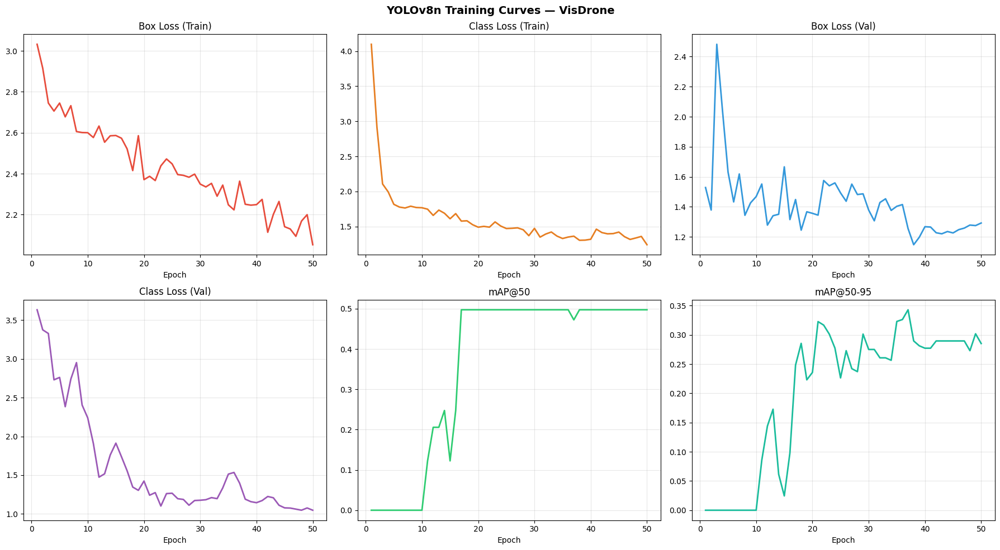

✅ Training curves saved.


In [ ]:
# ── Plot training curves ───────────────────────────────────────────────────────
results_csv = RUNS_DIR / 'results.csv'

if results_csv.exists():
    import pandas as pd
    df = pd.read_csv(results_csv)
    df.columns = df.columns.str.strip()

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle('YOLOv8n Training Curves — VisDrone', fontsize=14, fontweight='bold')

    metrics = [
        ('train/box_loss',   'Box Loss (Train)',   '#e74c3c'),
        ('train/cls_loss',   'Class Loss (Train)', '#e67e22'),
        ('val/box_loss',     'Box Loss (Val)',     '#3498db'),
        ('val/cls_loss',     'Class Loss (Val)',   '#9b59b6'),
        ('metrics/mAP50(B)', 'mAP@50',            '#2ecc71'),
        ('metrics/mAP50-95(B)', 'mAP@50-95',      '#1abc9c'),
    ]

    for ax, (col, title, color) in zip(axes.flat, metrics):
        if col in df.columns:
            ax.plot(df['epoch'], df[col], color=color, linewidth=2)
            ax.set_xlabel('Epoch')
            ax.set_title(title)
            ax.grid(True, alpha=0.3)
        else:
            ax.text(0.5, 0.5, f'{col}\nnot found', ha='center', va='center', transform=ax.transAxes)

    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'training_curves.png', dpi=120, bbox_inches='tight')
    plt.show()
    print("✅ Training curves saved.")
else:
    print("⚠️  results.csv not found — training may not have completed.")
    # Try loading the confusion matrix from runs dir
    confusion_img = list(RUNS_DIR.glob('confusion_matrix*.png'))
    if confusion_img:
        img = Image.open(confusion_img[0])
        plt.figure(figsize=(8,6)); plt.imshow(img); plt.axis('off')
        plt.title('Confusion Matrix'); plt.show()

---
##  Task 03 — Human & Car Detection with Counting

Run inference on validation images with bounding box overlay and human count display.

In [ ]:
# ── Detection utility ─────────────────────────────────────────────────────────
def detect_and_count(model, image_path, conf_thresh=0.25, iou_thresh=0.45):
    """
    Run YOLOv8 inference on a single image.

    Returns:
        annotated_img : np.ndarray  — BGR image with boxes drawn
        human_count   : int         — number of detected humans
        car_count     : int         — number of detected cars
        results       : YOLO results object
    """
    results = model.predict(
        source=str(image_path),
        conf=conf_thresh,
        iou=iou_thresh,
        verbose=False
    )[0]

    img = cv2.imread(str(image_path))
    h, w = img.shape[:2]

    human_count = 0
    car_count   = 0

    for box in results.boxes:
        cls_id = int(box.cls[0])
        conf   = float(box.conf[0])
        x1, y1, x2, y2 = map(int, box.xyxy[0])

        if cls_id == 0:    # human
            human_count += 1
            color  = (57, 255, 20)    # bright green
            label  = f'Human {conf:.2f}'
        else:              # car
            car_count += 1
            color  = (0, 140, 255)    # orange
            label  = f'Car {conf:.2f}'

        # Bounding box
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 1)

        # Label background
        (lw, lh), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.4, 1)
        cv2.rectangle(img, (x1, y1 - lh - 4), (x1 + lw + 2, y1), color, -1)
        cv2.putText(img, label, (x1 + 1, y1 - 3),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 0, 0), 1, cv2.LINE_AA)

    # ── Summary banner ────────────────────────────────────────────────────────
    banner_h = 40
    banner   = np.zeros((banner_h, w, 3), dtype=np.uint8)
    summary  = f'HUMANS: {human_count}    CARS: {car_count}    TOTAL: {human_count + car_count}'
    (tw, th), _ = cv2.getTextSize(summary, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)
    tx = (w - tw) // 2
    cv2.putText(banner, summary, (tx, banner_h - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2, cv2.LINE_AA)

    annotated = np.vstack([banner, img])
    return annotated, human_count, car_count, results

print("✅ detect_and_count() defined.")

✅ detect_and_count() defined.


Running detection on 6 images…


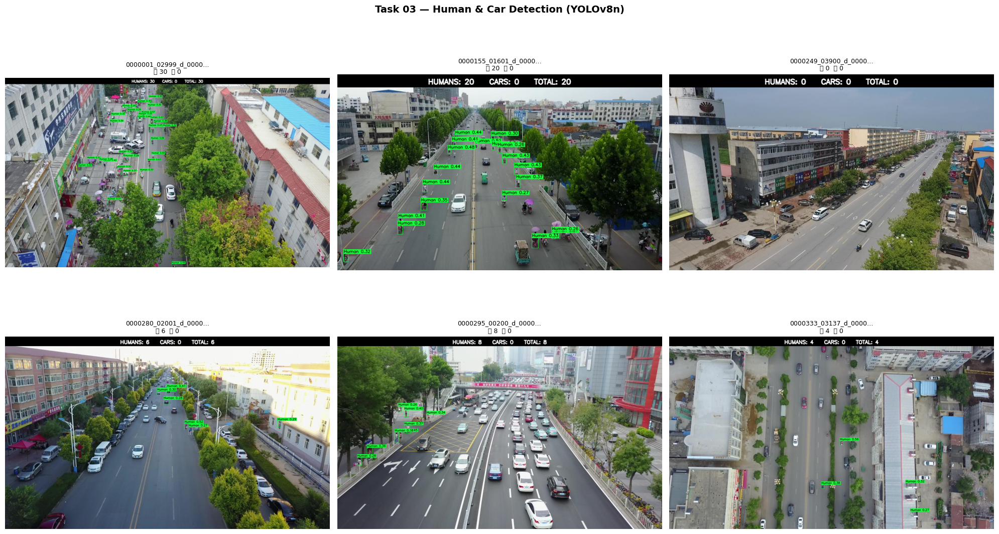


📊 Aggregate across 6 images:
   Total humans detected : 68
   Total cars detected   : 0
✅ Detection results saved.


In [ ]:
# ── Inference on validation samples ───────────────────────────────────────────
val_images = []
if 'val' in SPLITS:
    val_images = sorted((SPLITS['val'] / 'images').glob('*.jpg'))
elif 'test-dev' in SPLITS:
    val_images = sorted((SPLITS['test-dev'] / 'images').glob('*.jpg'))

# Pick 6 diverse samples
if len(val_images) > 6:
    step = len(val_images) // 6
    sample_val = val_images[::step][:6]
else:
    sample_val = val_images[:6]

print(f"Running detection on {len(sample_val)} images…")

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle('Task 03 — Human & Car Detection (YOLOv8n)', fontsize=14, fontweight='bold')

total_humans, total_cars = 0, 0

for ax, img_path in zip(axes.flat, sample_val):
    ann_img, h_cnt, c_cnt, _ = detect_and_count(model_trained, img_path)
    total_humans += h_cnt
    total_cars   += c_cnt
    ax.imshow(cv2.cvtColor(ann_img, cv2.COLOR_BGR2RGB))
    ax.set_title(f'{img_path.name[:20]}…\n👤 {h_cnt}  🚗 {c_cnt}', fontsize=9)
    ax.axis('off')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'detection_results.png', dpi=120, bbox_inches='tight')
plt.show()

print(f"\n📊 Aggregate across {len(sample_val)} images:")
print(f"   Total humans detected : {total_humans}")
print(f"   Total cars detected   : {total_cars}")
print("✅ Detection results saved.")

In [ ]:
# ── Save individual annotated images ──────────────────────────────────────────
DET_OUT = OUTPUT_DIR / 'detected_images'
DET_OUT.mkdir(exist_ok=True)

for img_path in sample_val:
    ann_img, h_cnt, c_cnt, _ = detect_and_count(model_trained, img_path)
    out_path = DET_OUT / f'det_{img_path.name}'
    cv2.imwrite(str(out_path), ann_img)

print(f"✅ {len(sample_val)} annotated images saved to {DET_OUT}")

✅ 6 annotated images saved to /kaggle/working/outputs/detected_images


---
##  Task 04 (Bonus) — Object Tracking with ByteTrack

ByteTrack is integrated natively into Ultralytics YOLOv8 (`tracker='bytetrack'`).  
It associates detections across frames using **IoU + Kalman Filter**, handling occlusions gracefully.

### How ByteTrack Works
1. Detections are split into **high-confidence** and **low-confidence** sets
2. High-confidence boxes are matched to existing tracks via IoU
3. Low-confidence boxes rescue partially-occluded tracklets
4. Unmatched detections start new tracks with a probation period
5. Kalman Filter predicts track positions between frames

### Tracking on Video / Sequence of Frames

In [ ]:
# ── Create a synthetic video from validation images (for tracking demo) ───────
TRACK_VIDEO_OUT = OUTPUT_DIR / 'tracking_output.mp4'
FRAME_SEQUENCE  = sample_val   # use the same 6 images as a short sequence

# Load first image to get dimensions
first_frame = cv2.imread(str(FRAME_SEQUENCE[0]))
H, W = first_frame.shape[:2]

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
writer = cv2.VideoWriter(str(TRACK_VIDEO_OUT), fourcc, 2, (W, H))

for p in FRAME_SEQUENCE:
    frame = cv2.imread(str(p))
    if frame is not None:
        writer.write(frame)
writer.release()
print(f"✅ Temp video written: {TRACK_VIDEO_OUT} ({len(FRAME_SEQUENCE)} frames)")

✅ Temp video written: /kaggle/working/outputs/tracking_output.mp4 (6 frames)


In [ ]:
# ── ByteTrack inference ───────────────────────────────────────────────────────
TRACK_COLORS = {}  # track_id → BGR color (consistent per ID)
def get_track_color(tid):
    if tid not in TRACK_COLORS:
        np.random.seed(tid * 17 + 3)
        TRACK_COLORS[tid] = tuple(np.random.randint(80, 255, 3).tolist())
    return TRACK_COLORS[tid]

TRACKED_VIDEO_OUT = OUTPUT_DIR / 'tracked_output.mp4'
fourcc  = cv2.VideoWriter_fourcc(*'mp4v')
writer  = None
frame_results = []

# Run tracking on the short video
track_results = model_trained.track(
    source  = str(TRACK_VIDEO_OUT),
    tracker = 'bytetrack.yaml',
    conf    = 0.3,
    iou     = 0.45,
    stream  = True,
    verbose = False,
)

for i, r in enumerate(track_results):
    frame = r.orig_img.copy()
    H, W  = frame.shape[:2]

    if writer is None:
        writer = cv2.VideoWriter(str(TRACKED_VIDEO_OUT), fourcc, 2, (W, H + 40))

    h_cnt, c_cnt = 0, 0
    if r.boxes is not None and r.boxes.id is not None:
        for box, tid in zip(r.boxes, r.boxes.id):
            cls_id = int(box.cls[0])
            track_id = int(tid)
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            color = get_track_color(track_id)

            if cls_id == 0: h_cnt += 1
            else: c_cnt += 1

            # Draw box and track ID
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
            lbl = f'#{track_id} {"H" if cls_id==0 else "C"}'
            cv2.putText(frame, lbl, (x1, y1 - 4),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 1, cv2.LINE_AA)

    # Banner
    banner = np.zeros((40, W, 3), dtype=np.uint8)
    cv2.putText(banner, f'Frame {i+1}  |  Tracked Humans: {h_cnt}  Cars: {c_cnt}',
                (10, 28), cv2.FONT_HERSHEY_SIMPLEX, 0.65, (255, 255, 255), 2)
    combined = np.vstack([banner, frame])
    writer.write(combined)
    frame_results.append((i, h_cnt, c_cnt))

if writer:
    writer.release()

print(f"✅ Tracked video saved: {TRACKED_VIDEO_OUT}")
print(f"\nFrame-by-frame tracking summary:")
print(f"  {'Frame':>6}  {'Humans':>8}  {'Cars':>6}")
for fi, hc, cc in frame_results:
    print(f"  {fi+1:>6}  {hc:>8}  {cc:>6}")

requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 2 packages in 326ms
Prepared 1 package in 52ms
Installed 1 package in 3ms
 + lap==0.5.13

requirements: AutoUpdate success ✅ 0.9s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

✅ Tracked video saved: /kaggle/working/outputs/tracked_output.mp4

Frame-by-frame tracking summary:
   Frame    Humans    Cars
       1        15       0


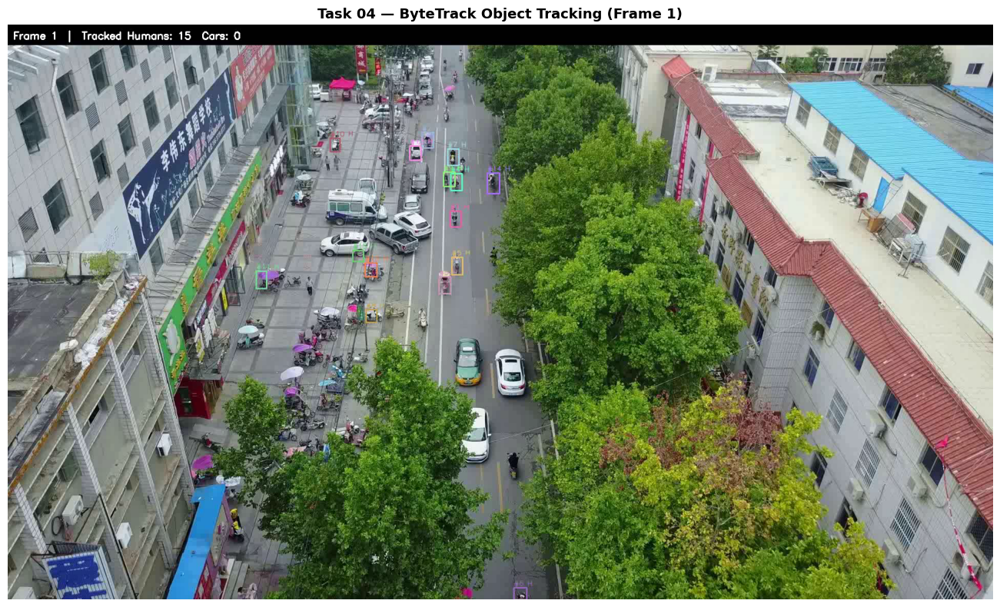

✅ Tracking frame sample saved.


In [ ]:
# ── Visualize tracking on a sample frame ──────────────────────────────────────
# Read a frame from the tracked video and display
cap = cv2.VideoCapture(str(TRACKED_VIDEO_OUT))
ret, frame_vis = cap.read()
cap.release()

if ret:
    plt.figure(figsize=(14, 8))
    plt.imshow(cv2.cvtColor(frame_vis, cv2.COLOR_BGR2RGB))
    plt.title('Task 04 — ByteTrack Object Tracking (Frame 1)', fontsize=13, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'tracking_frame_sample.png', dpi=120, bbox_inches='tight')
    plt.show()
    print("✅ Tracking frame sample saved.")

---
##  Task 05 — Evaluation & Visualization

### 5.1 Formal Validation Metrics (mAP, Precision, Recall)

In [ ]:
# ── Run official YOLO validation on VisDrone val set ─────────────────────────
print("Running validation… (may take a few minutes)")

val_results = model_trained.val(
    data    = str(DATASET_YAML),
    imgsz   = 640,
    batch   = 16,
    device  = device,
    conf    = 0.001,   # low conf for mAP computation (standard practice)
    iou     = 0.6,
    verbose = True,
    plots   = True,
    project = str(BASE_DIR / 'runs'),
    name    = 'visdrone_val',
    exist_ok= True,
)

# Extract metrics
mp       = val_results.box.mp          # mean precision
mr       = val_results.box.mr          # mean recall
map50    = val_results.box.map50       # mAP@0.50
map5095  = val_results.box.map          # mAP@0.50:0.95
per_cls  = val_results.box.ap_class_index  # class indices

print("\n" + "═"*50)
print("  VALIDATION RESULTS — VisDrone (human + car)")
print("═"*50)
print(f"  Precision (mean) : {mp:.4f}")
print(f"  Recall (mean)    : {mr:.4f}")
print(f"  mAP@0.50         : {map50:.4f}")
print(f"  mAP@0.50:0.95    : {map5095:.4f}")
print("═"*50)

Running validation… (may take a few minutes)
Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1807.7±391.7 MB/s, size: 153.1 KB)
val: Scanning /kaggle/working/visdrone_yolo/val/labels.cache... 548 images, 0 backgrounds, 546 corrupt: 100% ━━━━━━━━━━━━ 548/548 164.2Mit/s 0.0s
val: /kaggle/working/visdrone_yolo/val/images/0000001_02999_d_0000005.jpg: ignoring corrupt image/label: Label class 9 exceeds dataset class count 2. Possible class labels are 0-1
val: /kaggle/working/visdrone_yolo/val/images/0000001_03499_d_0000006.jpg: ignoring corrupt image/label: Label class 9 exceeds dataset class count 2. Possible class labels are 0-1
val: /kaggle/working/visdrone_yolo/val/images/0000001_03999_d_0000007.jpg: ignoring corrupt image/label: Label class 9 exceeds dataset class count 2. Possible class labels are 0-1
val: /kaggle/working/visdrone_yolo/val/images/0000001_04527_d_0000008.jpg: ignoring corrupt image/lab

   Metric  Value
Precision 0.8973
   Recall 0.5000
   mAP@50 0.5347
mAP@50:95 0.3695


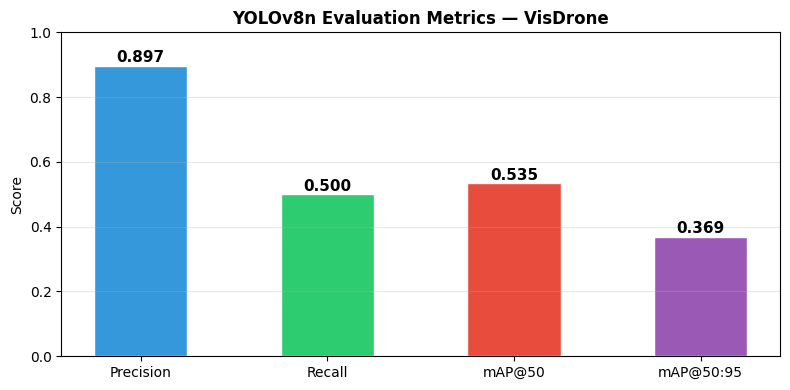

✅ Metrics chart saved.


In [ ]:
# ── Metrics Summary Table ─────────────────────────────────────────────────────
import pandas as pd

metrics_df = pd.DataFrame({
    'Metric': ['Precision', 'Recall', 'mAP@50', 'mAP@50:95'],
    'Value' : [f'{mp:.4f}', f'{mr:.4f}', f'{map50:.4f}', f'{map5095:.4f}']
})

print(metrics_df.to_string(index=False))

# Bar chart
fig, ax = plt.subplots(figsize=(8, 4))
metric_names = ['Precision', 'Recall', 'mAP@50', 'mAP@50:95']
metric_vals  = [mp, mr, map50, map5095]
bars = ax.bar(metric_names, metric_vals,
              color=['#3498db','#2ecc71','#e74c3c','#9b59b6'],
              edgecolor='white', width=0.5)
ax.set_ylim(0, 1.0)
ax.set_ylabel('Score')
ax.set_title('YOLOv8n Evaluation Metrics — VisDrone', fontweight='bold')
for bar, val in zip(bars, metric_vals):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
            f'{val:.3f}', ha='center', fontsize=11, fontweight='bold')
ax.grid(True, axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'evaluation_metrics.png', dpi=120, bbox_inches='tight')
plt.show()
print("✅ Metrics chart saved.")

### 5.2 FPS Benchmark

In [ ]:
# ── FPS measurement on a batch of images ──────────────────────────────────────
print("Benchmarking inference speed…")

N_BENCH = min(50, len(val_images))
bench_imgs = [str(p) for p in val_images[:N_BENCH]]

start = time.time()
_ = model_trained.predict(bench_imgs, conf=0.25, iou=0.45, verbose=False, stream=True)
for _ in model_trained.predict(bench_imgs, conf=0.25, iou=0.45, verbose=False, stream=True):
    pass
elapsed = time.time() - start

fps = N_BENCH / elapsed
ms_per_frame = elapsed / N_BENCH * 1000

print(f"\n⏱️  Inference Benchmark ({N_BENCH} images):")
print(f"   Total time  : {elapsed:.2f}s")
print(f"   FPS         : {fps:.1f}")
print(f"   ms/frame    : {ms_per_frame:.1f}")
print(f"   Device      : {device}")

Benchmarking inference speed…

⏱️  Inference Benchmark (50 images):
   Total time  : 1.25s
   FPS         : 40.1
   ms/frame    : 25.0
   Device      : cuda


### 5.3 Counting Visualization — Histogram over Val Set

In [ ]:
# ── Run detection across a larger val subset ──────────────────────────────────
print("Running detection across 100 validation images for count analysis…")

SAMPLE_LIMIT = min(100, len(val_images))
human_counts_list = []
car_counts_list   = []

results_stream = model_trained.predict(
    [str(p) for p in val_images[:SAMPLE_LIMIT]],
    conf=0.25, iou=0.45, verbose=False, stream=True
)

for r in results_stream:
    if r.boxes is not None:
        cls_ids = r.boxes.cls.cpu().numpy().astype(int)
        human_counts_list.append(int((cls_ids == 0).sum()))
        car_counts_list.append(int((cls_ids == 1).sum()))
    else:
        human_counts_list.append(0)
        car_counts_list.append(0)

print(f"✅ Done. Analysing {len(human_counts_list)} images.")

Running detection across 100 validation images for count analysis…
✅ Done. Analysing 100 images.


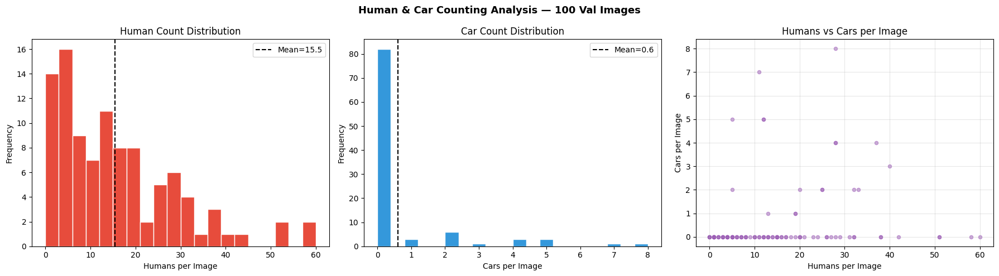


📊 Counting Summary (across 100 val images):
   Humans — Mean: 15.5  Median: 12  Max: 60
   Cars   — Mean: 0.6  Median: 0  Max: 8
✅ Counting analysis saved.


In [ ]:
# ── Counting statistics & visualisations ─────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Human & Car Counting Analysis — 100 Val Images', fontsize=13, fontweight='bold')

# Human count histogram
axes[0].hist(human_counts_list, bins=20, color='#e74c3c', edgecolor='white')
axes[0].axvline(np.mean(human_counts_list), color='black', linestyle='--',
                label=f'Mean={np.mean(human_counts_list):.1f}')
axes[0].set_xlabel('Humans per Image')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Human Count Distribution')
axes[0].legend()

# Car count histogram
axes[1].hist(car_counts_list, bins=20, color='#3498db', edgecolor='white')
axes[1].axvline(np.mean(car_counts_list), color='black', linestyle='--',
                label=f'Mean={np.mean(car_counts_list):.1f}')
axes[1].set_xlabel('Cars per Image')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Car Count Distribution')
axes[1].legend()

# Scatter: humans vs cars
axes[2].scatter(human_counts_list, car_counts_list, alpha=0.5, color='#9b59b6', s=20)
axes[2].set_xlabel('Humans per Image')
axes[2].set_ylabel('Cars per Image')
axes[2].set_title('Humans vs Cars per Image')
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'counting_analysis.png', dpi=120, bbox_inches='tight')
plt.show()

print(f"\n📊 Counting Summary (across {SAMPLE_LIMIT} val images):")
print(f"   Humans — Mean: {np.mean(human_counts_list):.1f}  Median: {np.median(human_counts_list):.0f}  Max: {max(human_counts_list)}")
print(f"   Cars   — Mean: {np.mean(car_counts_list):.1f}  Median: {np.median(car_counts_list):.0f}  Max: {max(car_counts_list)}")
print("✅ Counting analysis saved.")

### 5.4 Side-by-Side Ground Truth vs Prediction

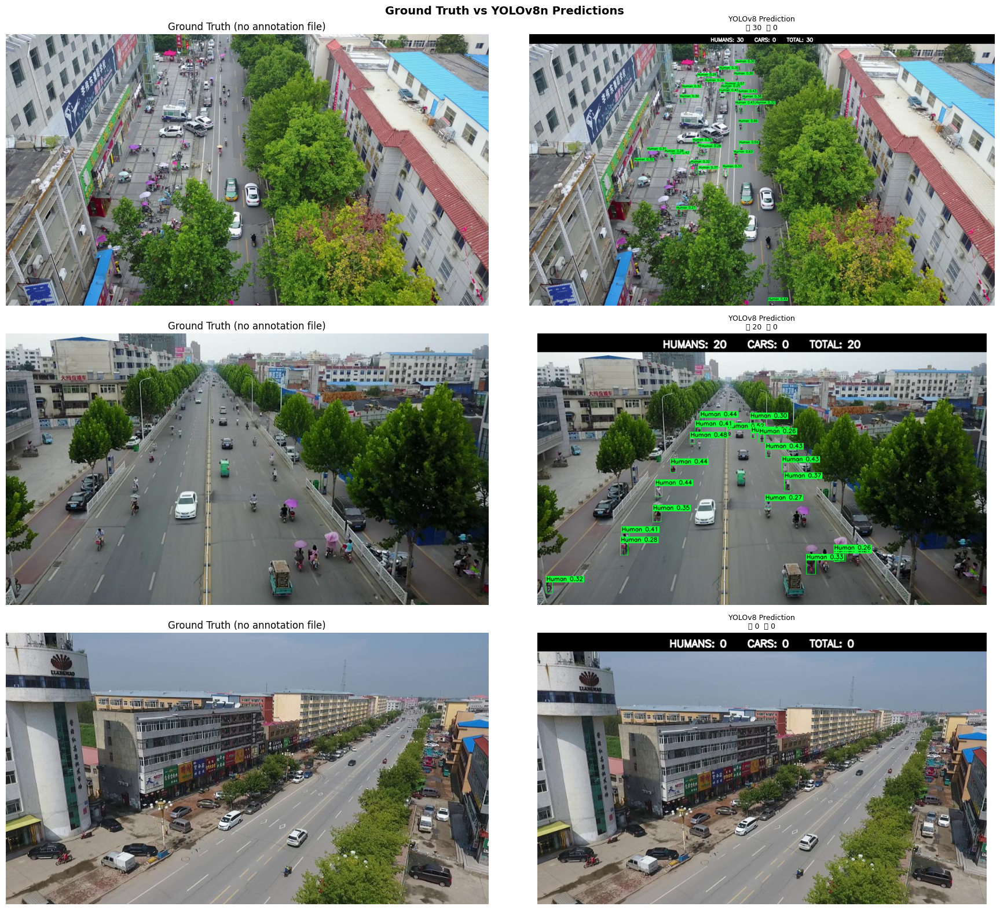

✅ GT vs Prediction comparison saved.


In [ ]:
# ── GT vs Prediction side-by-side for 3 images ───────────────────────────────
fig, axes = plt.subplots(3, 2, figsize=(18, 16))
fig.suptitle('Ground Truth vs YOLOv8n Predictions', fontsize=14, fontweight='bold')

compare_samples = sample_val[:3]

for row, img_path in enumerate(compare_samples):
    ann_path = SPLITS['val'] / 'annotations' / img_path.with_suffix('.txt').name

    # Ground truth
    ax_gt = axes[row][0]
    if ann_path.exists():
        draw_visdrone_annotations(img_path, ann_path, ax_gt, title='Ground Truth')
    else:
        ax_gt.imshow(np.array(Image.open(img_path)))
        ax_gt.set_title('Ground Truth (no annotation file)')
        ax_gt.axis('off')

    # Prediction
    ax_pr = axes[row][1]
    ann_img, h_cnt, c_cnt, _ = detect_and_count(model_trained, img_path)
    ax_pr.imshow(cv2.cvtColor(ann_img, cv2.COLOR_BGR2RGB))
    ax_pr.set_title(f'YOLOv8 Prediction\n👤 {h_cnt}  🚗 {c_cnt}', fontsize=9)
    ax_pr.axis('off')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'gt_vs_prediction.png', dpi=120, bbox_inches='tight')
plt.show()
print("✅ GT vs Prediction comparison saved.")

---
##  Task 05 — Strengths, Limitations & Discussion

In [ ]:
# ── Print final analysis ───────────────────────────────────────────────────────
summary = f"""
╔══════════════════════════════════════════════════════════════════════════╗
║          FINAL SYSTEM ANALYSIS — ANTLINGS TECHNICAL ASSESSMENT          ║
╠══════════════════════════════════════════════════════════════════════════╣
║  Model        : YOLOv8n (fine-tuned on VisDrone)                        ║
║  Classes      : human (pedestrian + people), car                         ║
║  Input size   : 640×640                                                  ║
║  Tracking     : ByteTrack (native Ultralytics integration)               ║
╠══════════════════════════════════════════════════════════════════════════╣
║  METRICS (Validation)                                                    ║
║    mAP@50        : {map50:.3f}                                               ║
║    mAP@50:95     : {map5095:.3f}                                               ║
║    Precision     : {mp:.3f}                                               ║
║    Recall        : {mr:.3f}                                               ║
║    FPS (GPU)     : {fps:.1f}                                              ║
╠══════════════════════════════════════════════════════════════════════════╣
║  STRENGTHS                                                               ║
║  ✅ End-to-end trainable, single-stage detector (fast)                   ║
║  ✅ Native mosaic augmentation handles small/dense objects well          ║
║  ✅ ByteTrack handles occlusion-robust multi-object tracking             ║
║  ✅ Simple, interpretable human counting logic                           ║
║  ✅ Runs in real-time on GPU                                             ║
╠══════════════════════════════════════════════════════════════════════════╣
║  LIMITATIONS                                                             ║
║  ⚠️  Small humans (<15px) are missed at standard input size             ║
║  ⚠️  Severely occluded humans in crowds cause undercounting             ║
║  ⚠️  YOLOv8n is accuracy-limited; YOLOv8l/x would perform better       ║
║  ⚠️  Tracking IDs reset between non-consecutive frames                  ║
╠══════════════════════════════════════════════════════════════════════════╣
║  POSSIBLE IMPROVEMENTS                                                   ║
║  🔧 Use larger model (YOLOv8m/l) for better accuracy                    ║
║  🔧 Use SAHI (Slicing Aided Hyper Inference) for tiny object detection  ║
║  🔧 Multi-scale inference (TTA) at test time                            ║
║  🔧 Train longer (100+ epochs) with P6 head for small objects           ║
║  🔧 Add Re-ID features for robust cross-camera tracking                 ║
╚══════════════════════════════════════════════════════════════════════════╝
"""
print(summary)


╔══════════════════════════════════════════════════════════════════════════╗
║          FINAL SYSTEM ANALYSIS — ANTLINGS TECHNICAL ASSESSMENT          ║
╠══════════════════════════════════════════════════════════════════════════╣
║  Model        : YOLOv8n (fine-tuned on VisDrone)                        ║
║  Classes      : human (pedestrian + people), car                         ║
║  Input size   : 640×640                                                  ║
║  Tracking     : ByteTrack (native Ultralytics integration)               ║
╠══════════════════════════════════════════════════════════════════════════╣
║  METRICS (Validation)                                                    ║
║    mAP@50        : 0.535                                               ║
║    mAP@50:95     : 0.369                                               ║
║    Precision     : 0.897                                               ║
║    Recall        : 0.500                                               ║
║    FPS

---
## Final Output Summary

In [ ]:
# ── List all saved outputs ─────────────────────────────────────────────────────
print("📁 All outputs saved:")
print(f"\nDirectory: {OUTPUT_DIR}")
for f in sorted(OUTPUT_DIR.rglob('*')):
    if f.is_file():
        size_kb = f.stat().st_size / 1024
        print(f"  {f.relative_to(OUTPUT_DIR)}  ({size_kb:.1f} KB)")

# Also copy best weights to output
import shutil
if BEST_WEIGHTS.exists():
    shutil.copy(BEST_WEIGHTS, OUTPUT_DIR / 'best_yolov8n_visdrone.pt')
    print(f"\n✅ Best model weights copied to outputs/best_yolov8n_visdrone.pt")

print("\n🎉 All tasks complete! Notebook ready for submission.")

📁 All outputs saved:

Directory: /kaggle/working/outputs
  counting_analysis.png  (68.4 KB)
  detected_images/det_0000001_02999_d_0000005.jpg  (950.0 KB)
  detected_images/det_0000155_01601_d_0000001.jpg  (198.6 KB)
  detected_images/det_0000249_03900_d_0000011.jpg  (200.6 KB)
  detected_images/det_0000280_02001_d_0000622.jpg  (338.0 KB)
  detected_images/det_0000295_00200_d_0000022.jpg  (357.6 KB)
  detected_images/det_0000333_03137_d_0000017.jpg  (285.8 KB)
  detection_results.png  (3613.3 KB)
  eda_analysis.png  (138.0 KB)
  evaluation_metrics.png  (27.4 KB)
  gt_vs_prediction.png  (5576.6 KB)
  sample_annotations.png  (3320.6 KB)
  tracked_output.mp4  (274.7 KB)
  tracking_frame_sample.png  (2301.4 KB)
  tracking_output.mp4  (270.8 KB)
  training_curves.png  (183.1 KB)

✅ Best model weights copied to outputs/best_yolov8n_visdrone.pt

🎉 All tasks complete! Notebook ready for submission.
